## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---

## Import packages

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
%matplotlib inline

## Calculate Camera Calibration Matrix and Distortion Coefficients

In [2]:
def find_object_image_sets(path_str, nx, ny, show_img=False):
    object_sets = []
    image_sets = []
    
    # Generate a matrics, have nx * ny rows, 3 colomns, type is np.float32
    object_points = np.zeros((nx * ny, 3), np.float32)
    object_points[:, :2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)
    
    # Load all chessboard images path
    chessboard_imgs_path = glob.glob(path_str)

    for chessboard_img_path in chessboard_imgs_path:
        # Load image
        img = cv2.imread(chessboard_img_path)
        
        # Convert into grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
        
        if ret == True:
            object_sets.append(object_points)
            image_sets.append(corners)
            
            # Draw the corners on the chessboard
            if show_img == True:
                cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
                f, ax = plt.subplots(1, 1, figsize=(7, 7))
                ax.imshow(img)
                ax.axis('off')
                ax.set_title(chessboard_img_path, fontsize = 20)
                
    size = (mpimg.imread(chessboard_imgs_path[0]).shape[1], mpimg.imread(chessboard_imgs_path[0]).shape[0])

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(object_sets, image_sets, size, None, None)
    return (mtx, dist)

### Show the chessboard with the corners in it

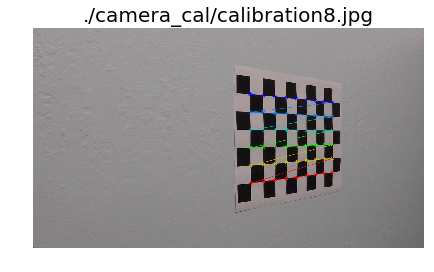

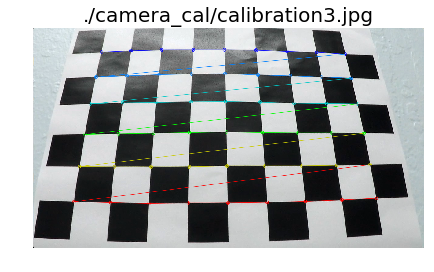

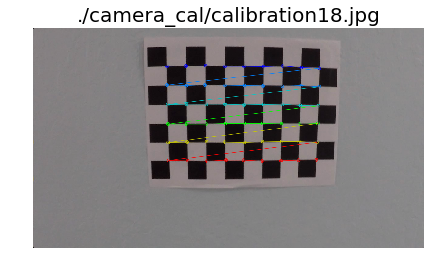

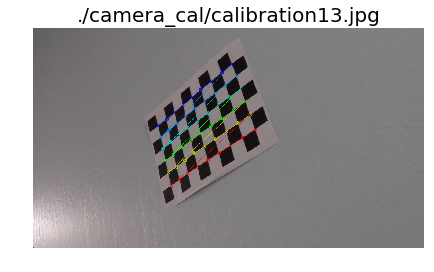

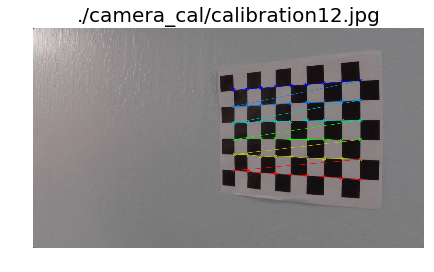

...

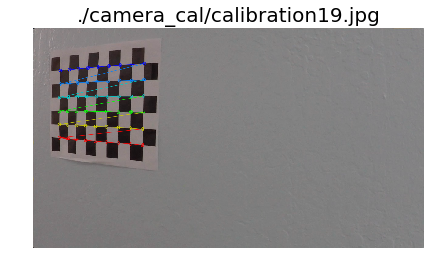

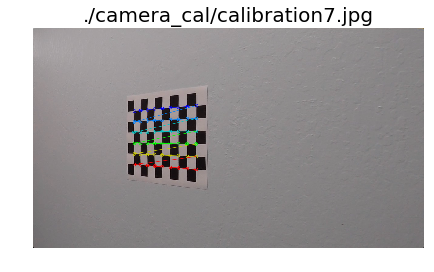

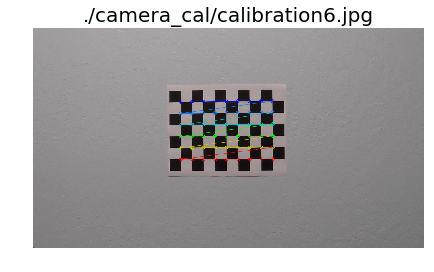

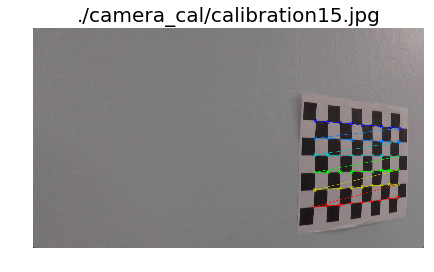

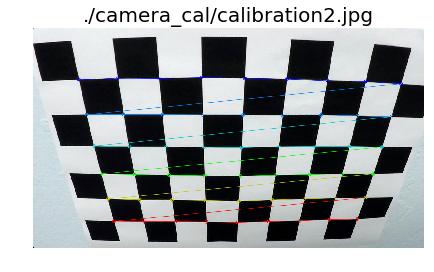

In [3]:
chessboard_imgs_path = "./camera_cal/*.jpg"

nx = 9 # The number of inside corners in x
ny = 6 # The number of inside corners in y

calibration_matrix, distortion_coefficients = find_object_image_sets(chessboard_imgs_path, nx, ny, True)

## Undistort Image Using Calibration Matrix and Distortion Coefficient 

In [4]:
def undistort_image(image, calibration_matrix, distortion_coefficients):
    undistorted_image = cv2.undistort(image, calibration_matrix, distortion_coefficients, None, calibration_matrix)
    return undistorted_image

### Show the undistorted chessboard

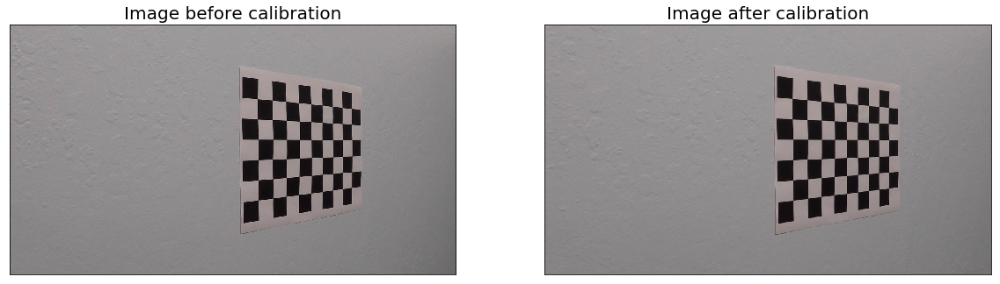

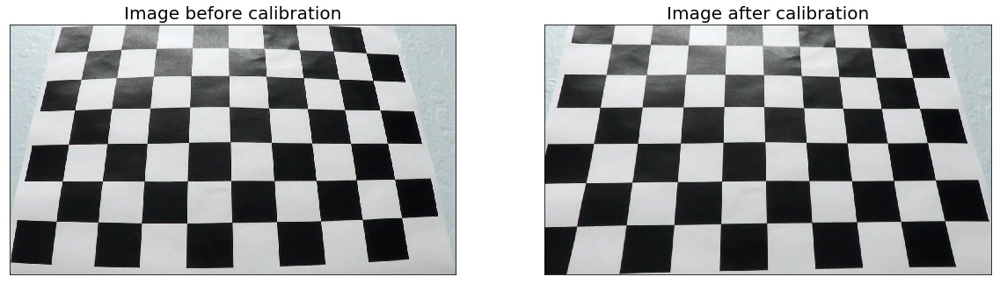

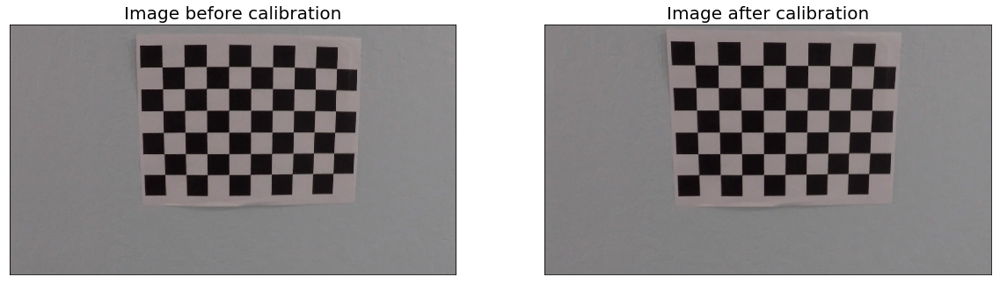

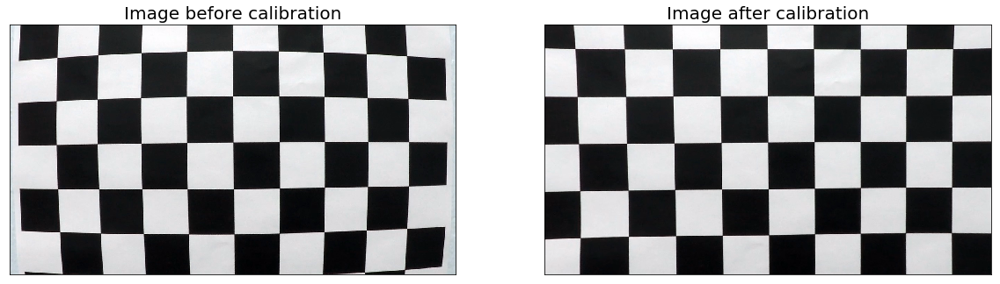

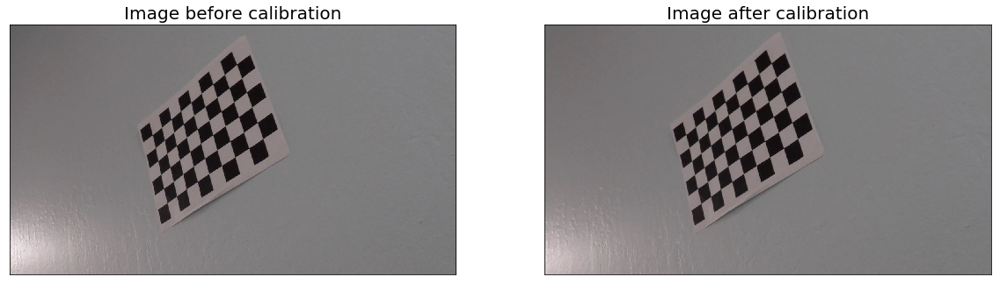

...

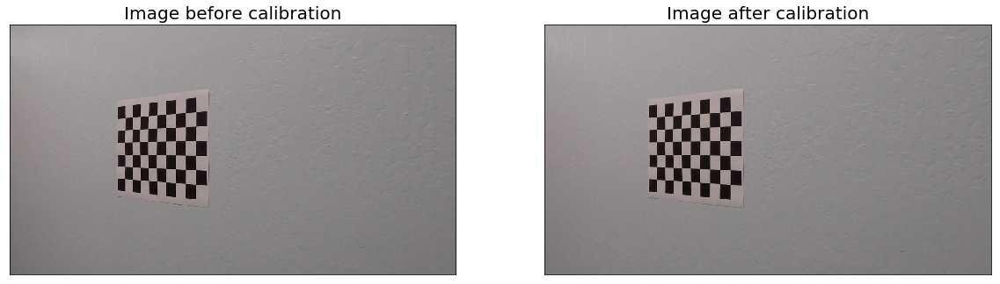

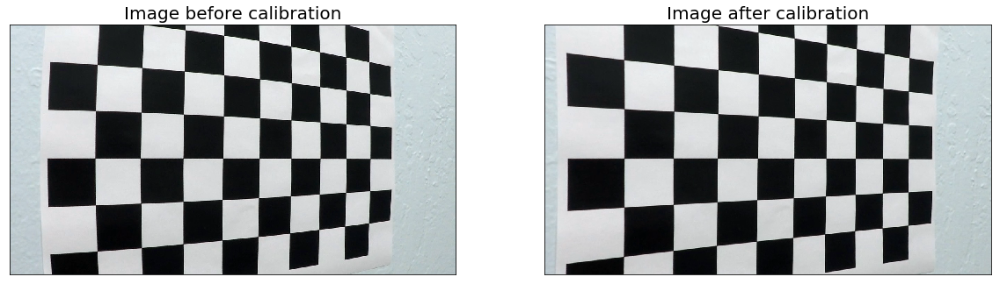

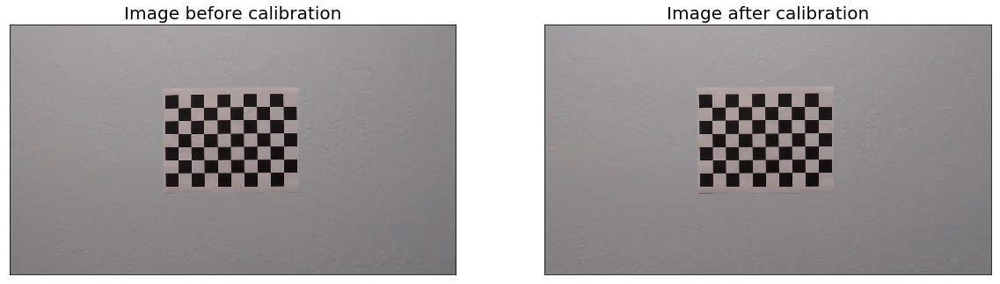

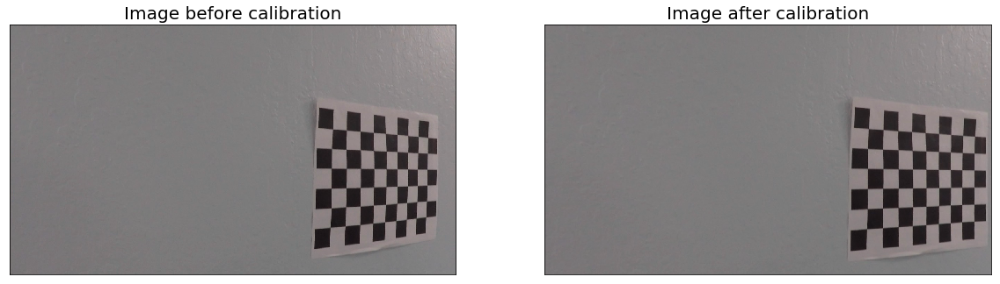

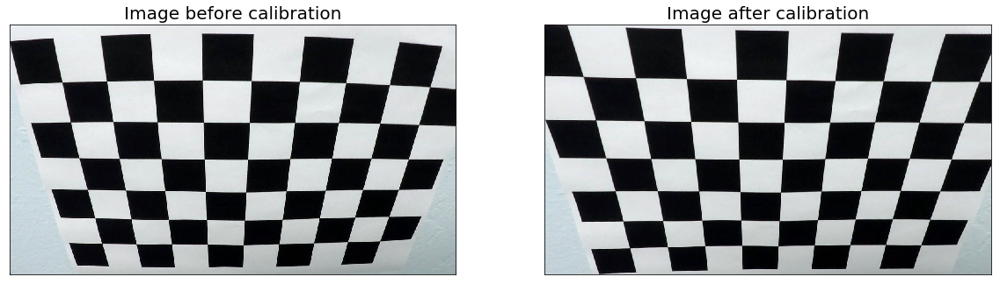

In [5]:
# Load all chessboard images
chessboard_imgs_list = glob.glob(chessboard_imgs_path)

for chessboard_img in chessboard_imgs_list:
    original_image = cv2.imread(chessboard_img)
    undistorted_image = undistort_image(original_image, calibration_matrix, distortion_coefficients)
    fig, axes = plt.subplots(1, 2, figsize=(20,10), subplot_kw={'xticks':[], 'yticks':[]})
    axes[0].imshow(original_image)
    axes[0].set_title('Image before calibration', fontsize = 20)
    axes[1].imshow(undistorted_image)
    axes[1].set_title('Image after calibration', fontsize = 20)

### Show the undistorted test road images

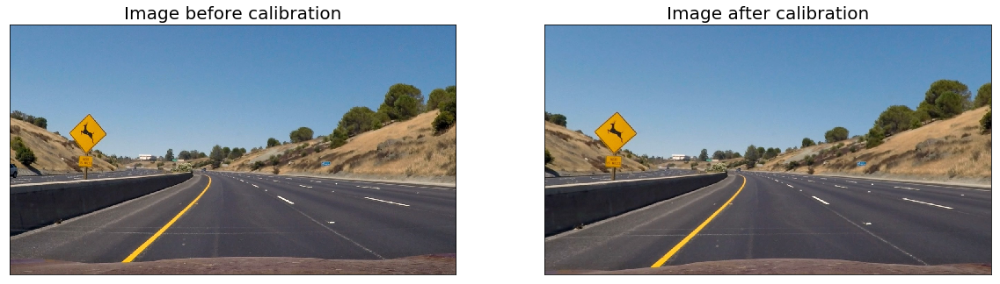

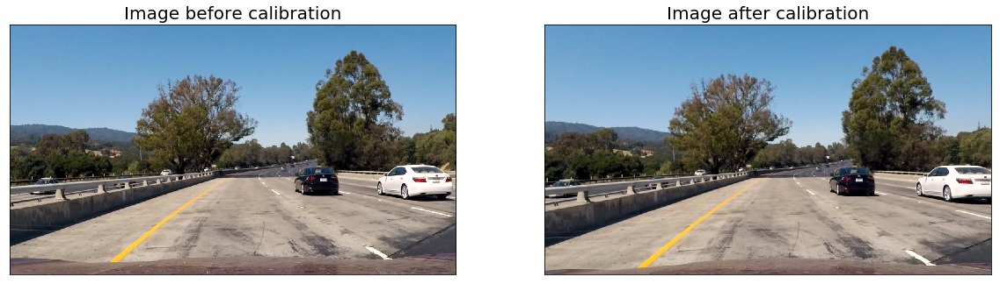

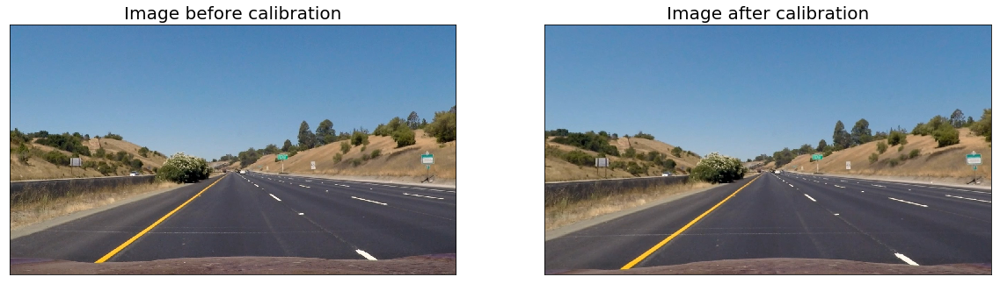

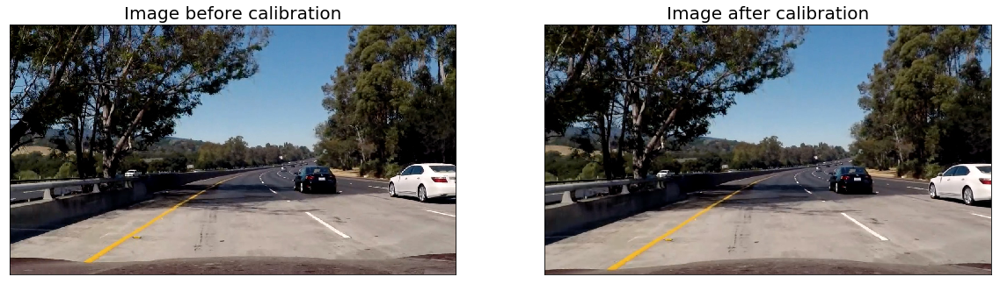

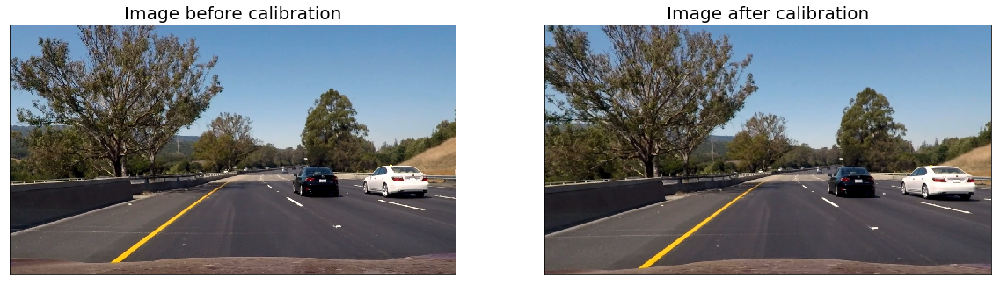

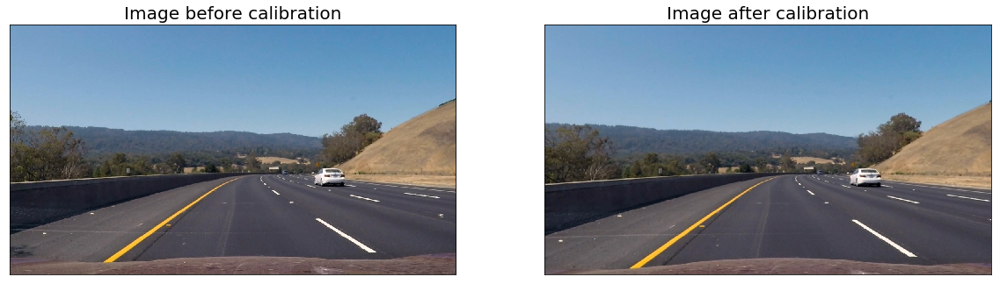

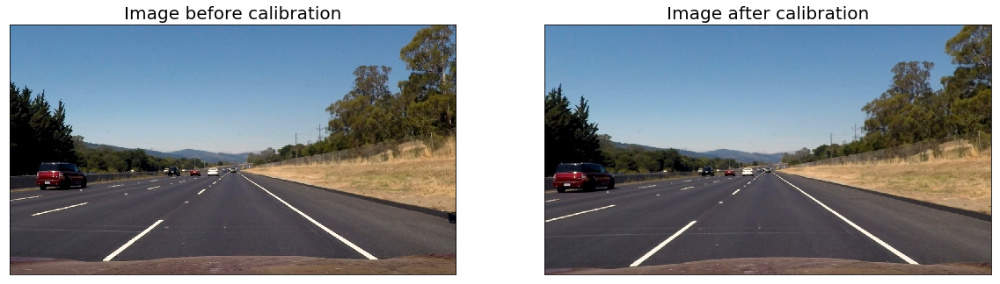

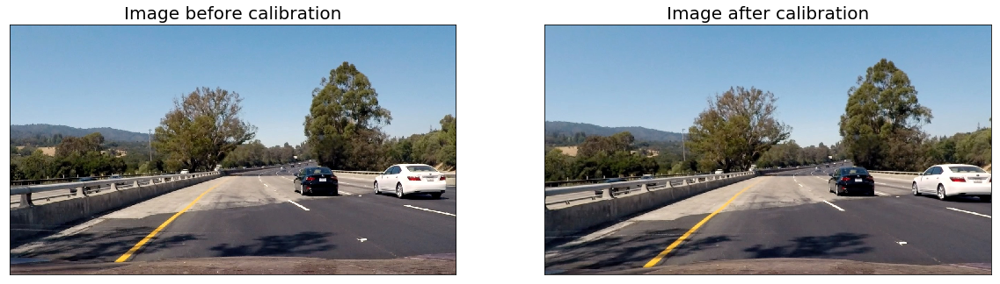

In [7]:
# Load all chessboard images

road_imgs_path = "test_images/*.jpg"
road_imgs_list = glob.glob(road_imgs_path)

for road_img in road_imgs_list:
    original_image = cv2.imread(road_img)
    undistorted_image = undistort_image(original_image, calibration_matrix, distortion_coefficients)
    fig, axes = plt.subplots(1, 2, figsize=(20,10), subplot_kw={'xticks':[], 'yticks':[]})
    axes[0].imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Image before calibration', fontsize = 20)
    axes[1].imshow(cv2.cvtColor(undistorted_image, cv2.COLOR_BGR2RGB))
    axes[1].set_title('Image after calibration', fontsize = 20)